# Deep Learning Project 3: Adversarial Attack Implementation and Evaluation
#### Team Members: Karthik Krapa, Krish Murjani, Pratham Saraf

This notebook implements and evaluates three types of adversarial attacks against a ResNet34 model pre-trained on ImageNet:
1. Fast Gradient Sign Method (FGSM) - A single-step attack
2. Projected Gradient Descent (PGD) - An iterative attack
3. Adversarial Patch - A localized attack

We'll analyze the effectiveness of each attack and study their transferability to a different model architecture.

# Initial Setup

In [ ]:
# Cell 1
# # First, check your current versions
# import pip
# !pip list | grep -E "torch|vision"

# # Uninstall current versions
# !pip uninstall -y torch torchvision torchaudio

# # Install compatible versions (for CUDA compatibility, adjust as needed)
# !pip install torch==2.0.1 torchvision==0.15.2 torchaudio==2.0.2 --index-url https://download.pytorch.org/whl/cu118

# # Restart the runtime after this (important!)

## Importing Libraries

We import all necessary libraries for this project:
- PyTorch and torchvision for deep learning models and data handling
- NumPy for numerical operations
- Matplotlib for visualization
- PIL for image manipulation
- tqdm for progress tracking
- os for file operations

In [ ]:
# Cell 2
# Import necessary libraries
import numpy as np 
import torch
from torch.utils.data import DataLoader
import torchvision 
import torchvision.transforms as T
import json
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import os
from PIL import Image
from torchvision.utils import save_image

Hardware accelerator: cuda:0


## Hardware Configuration and Setup

In this cell, we:
1. Check if a CUDA-capable GPU is available for acceleration
2. Define the normalization constants for ImageNet preprocessing
3. Create output directories to store adversarial examples generated by each attack method  

In [ ]:
# Cell 3
# Hardware configuration - use CUDA if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Hardware accelerator:", device)

# ImageNet normalization constants
IMAGENET_MEANS = np.array([0.485, 0.456, 0.406])
IMAGENET_STDEVS = np.array([0.229, 0.224, 0.225])

# Create output directories
os.makedirs("FGSM_Adversarial_Examples", exist_ok=True)
os.makedirs("PGD_Adversarial_Examples", exist_ok=True)
os.makedirs("Patch_Attack_Examples", exist_ok=True)

## Model and Dataset Initialization

Here, we:
1. Load a pre-trained ResNet34 model trained on ImageNet
2. Load the ImageNet class definitions from the provided JSON file
3. Extract class indices from the mapping
4. Set up the preprocessing pipeline with the appropriate normalization
5. Initialize the dataset with the specified transforms

In [ ]:
# Cell 4
# Initialize neural network - ResNet34 pretrained on ImageNet
model = torchvision.models.resnet34(weights='IMAGENET1K_V1').to(device)
model.eval()  # Set to inference mode

# Import ImageNet class definitions
target_file = "/kaggle/input/testdata/TestDataSet/labels_list.json"
with open(target_file) as file_handle:
    class_mapping = json.load(file_handle)
    
# Extract class indices from the mapping strings
target_class_ids = [int(entry.split(":")[0]) for entry in class_mapping]

# Define preprocessing pipeline
preprocess = T.Compose([
    T.ToTensor(),
    T.Normalize(IMAGENET_MEANS, IMAGENET_STDEVS)
])

# Create evaluation dataset
test_data = torchvision.datasets.ImageFolder(
    root="/kaggle/input/testdata/TestDataSet",
    transform=preprocess
)

## Data Loading Configuration

We configure the DataLoader for batch processing with:
- Batch size of 32
- No shuffling (to maintain order)
- 4 worker processes for parallel loading
  
We also initialize counters for accuracy metrics.

In [ ]:
# Cell 5
# Configure batch processing
batch_processor = DataLoader(
    test_data,
    batch_size=32,
    shuffle=False,
    num_workers=4
)

# Performance metrics initialization
correct_top1 = 0
correct_top5 = 0
sample_count = 0


# Task 1

## Baseline Model Evaluation

We evaluate the pre-trained ResNet34 model on the test dataset:
1. Process each batch of images
2. Compute top-1 and top-5 predictions
3. Count correct predictions
4. Track overall performance metrics

This establishes a baseline for comparing the effectiveness of adversarial attacks.

In [ ]:
# Cell 6
# Evaluation process
with torch.no_grad():  # Disable autograd for efficiency
    for input_batch, label_batch in tqdm(batch_processor, desc="Processing batches"):
        # Transfer data to target hardware
        input_batch = input_batch.to(device)
        label_batch = label_batch.to(device) + 401  # Offset for ImageNet class numbering
        
        # Forward pass
        predictions = model(input_batch)
        
        # Calculate top predictions
        _, top5_preds = predictions.topk(5, dim=1)
        top1_preds = top5_preds[:, 0]
        
        # Update accuracy counters
        correct_top1 += (top1_preds == label_batch).sum().item()
        correct_top5 += sum(label_batch[i] in top5_preds[i] for i in range(len(label_batch)))
        sample_count += label_batch.size(0)

## Final Accuracy Metrics

We calculate and display the final top-1 and top-5 accuracy percentages based on the evaluation performed in the previous cell. These metrics will serve as our baseline for measuring how effectively the adversarial attacks reduce model performance.

In [ ]:
# Cell 7
# Calculate final metrics
accuracy_top1 = (correct_top1 / sample_count) * 100
accuracy_top5 = (correct_top5 / sample_count) * 100

# Display results
print("Evaluation complete on {} samples".format(sample_count))
print("Top-1 accuracy: {:.2f}%".format(accuracy_top1))
print("Top-5 accuracy: {:.2f}%".format(accuracy_top5))

Processing batches:   0%|          | 0/16 [00:00<?, ?it/s]

Evaluation complete on 500 samples
Top-1 accuracy: 76.00%
Top-5 accuracy: 94.20%


## Image Processing Helper Functions

These utility functions are used throughout the notebook for:
1. `apply_normalization`: Apply the ImageNet normalization to tensors
2. `reverse_normalization`: Undo the normalization for visualization
3. `convert_to_tensor`: Convert PIL images to PyTorch tensors

These functions ensure consistent preprocessing across different attacks.

In [ ]:
# Cell 8
# Helper functions for image processing
def apply_normalization(tensor):
    """Apply ImageNet normalization to input tensor"""
    return T.Normalize(mean=IMAGENET_MEANS, std=IMAGENET_STDEVS)(tensor)

def reverse_normalization(tensor):
    """Undo ImageNet normalization for visualization"""
    return T.Normalize(
        mean=[-m/s for m, s in zip(IMAGENET_MEANS, IMAGENET_STDEVS)],
        std=[1/s for s in IMAGENET_STDEVS]
    )(tensor)

def convert_to_tensor(img):
    """Convert PIL image to tensor"""
    return T.ToTensor()(img)

# Task 2: FGSM

## FGSM Attack Implementation

The Fast Gradient Sign Method (FGSM) is a single-step adversarial attack that:
1. Computes the gradient of the loss with respect to the input
2. Creates a perturbation by taking the sign of the gradient
3. Scales this perturbation by a small epsilon value
4. Adds the perturbation to the original image
5. Clips the result to maintain valid pixel values [0,1]

This attack is simple but effective at fooling neural networks.

In [ ]:
# Cell 9
def create_fgsm_adversarial_example(model, image_tensor, true_label, epsilon, class_indices, device):
    """
    Generate adversarial example using Fast Gradient Sign Method (FGSM)
    
    Args:
        model: The target neural network
        image_tensor: Clean input image tensor
        true_label: Ground truth label
        epsilon: Maximum perturbation size (L-infinity norm)
        class_indices: List of target class indices
        device: Computation device (CPU/GPU)
        
    Returns:
        Adversarial example tensor
    """
    # Make input differentiable
    image_tensor.requires_grad = True
    
    # Prepare for model input
    normalized = apply_normalization(image_tensor)
    
    # Forward pass
    logits = model(normalized)
    filtered_logits = logits[:, class_indices]
    
    # Loss calculation
    target = torch.tensor([true_label], device=device)
    criterion = torch.nn.CrossEntropyLoss()
    loss = criterion(filtered_logits, target)
    
    # Backpropagation
    model.zero_grad()
    loss.backward()
    
    # Create adversarial example
    gradient_sign = image_tensor.grad.sign()
    perturbed_image = image_tensor + epsilon * gradient_sign
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    
    return perturbed_image

## Generating FGSM Adversarial Examples

In this cell, we:
1. Set the perturbation size (epsilon) for the FGSM attack
2. Load the raw dataset without preprocessing
3. Apply the FGSM attack to each image
4. Save the generated adversarial examples
5. Track statistics about the perturbations and model predictions

We use a small epsilon (0.02) to create perturbations that are subtle to human observers but can fool the model.

In [ ]:
# Cell 10
# Setup attack parameters
PERTURBATION_SIZE = 0.02  # Epsilon value for FGSM

# Load dataset (without transformations)
image_folder = "/kaggle/input/testdata/TestDataSet"
raw_dataset = torchvision.datasets.ImageFolder(root=image_folder)

# Storage for evaluation
clean_tensors = []
adversarial_tensors = []
ground_truth_labels = []
predicted_labels = []
perturbation_magnitudes = []

print("Generating FGSM adversarial examples...")

# Attack generation loop
for idx, (image, label) in enumerate(tqdm(raw_dataset, desc="FGSM Attack")):
    # Convert image to tensor
    input_tensor = convert_to_tensor(image).unsqueeze(0).to(device)
    
    # Generate adversarial example
    adversarial_tensor = create_fgsm_adversarial_example(
        model, input_tensor, label, PERTURBATION_SIZE, target_class_ids, device
    )
    
    # Save adversarial image
    filename = os.path.join("FGSM_Adversarial_Examples", "adversarial_{0:04d}.png".format(idx))
    save_image(adversarial_tensor.squeeze().cpu(), filename)
    
    # Get prediction on adversarial example
    with torch.no_grad():
        adv_norm = apply_normalization(adversarial_tensor)
        preds = model(adv_norm)
        top_pred = preds.argmax(dim=1).item()
    
    # Store for evaluation
    clean_tensors.append(apply_normalization(input_tensor).cpu())
    adversarial_tensors.append(adv_norm.cpu())
    ground_truth_labels.append(label)
    predicted_labels.append(top_pred)
    
    # Calculate perturbation magnitude
    l_inf = torch.max(torch.abs(adversarial_tensor - input_tensor)).item()
    perturbation_magnitudes.append(l_inf)

print("✓ FGSM attack complete.")
print("\nMaximum L∞ perturbation: {:.6f}".format(max(perturbation_magnitudes)))

Generating FGSM adversarial examples...


FGSM Attack:   0%|          | 0/500 [00:00<?, ?it/s]

✓ FGSM attack complete.

Maximum L∞ perturbation: 0.020000


## Visualizing FGSM Attack Results

We visualize up to 5 examples where the FGSM attack successfully fooled the model:
1. Find images that were correctly classified before but misclassified after the attack
2. Display side-by-side comparisons of original and adversarial images
3. Show the true class and the model's prediction for each pair

This helps us understand how small, imperceptible perturbations can cause misclassification.


Visualizing misclassified examples:


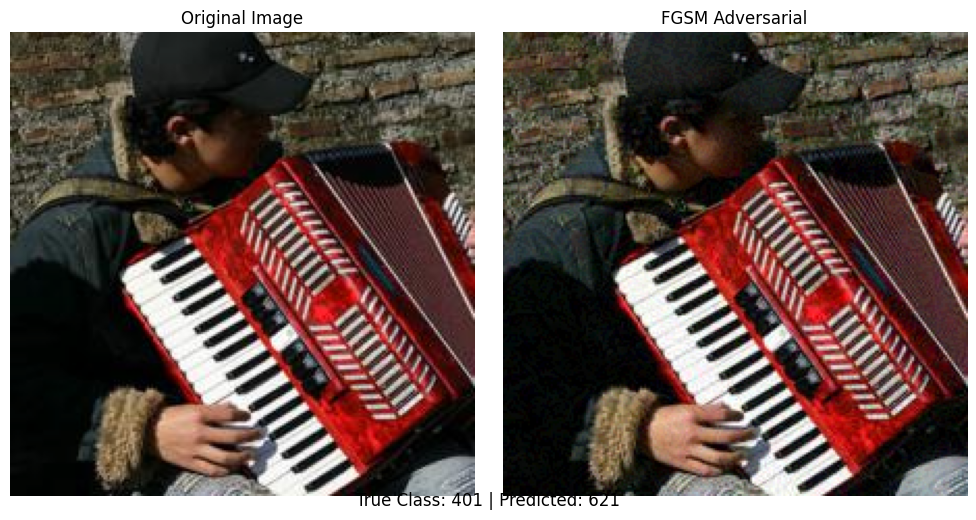

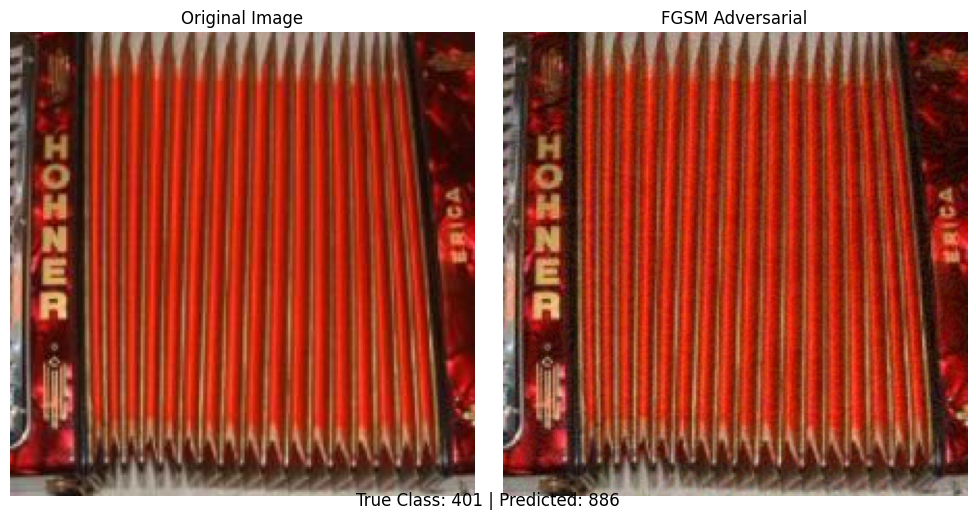

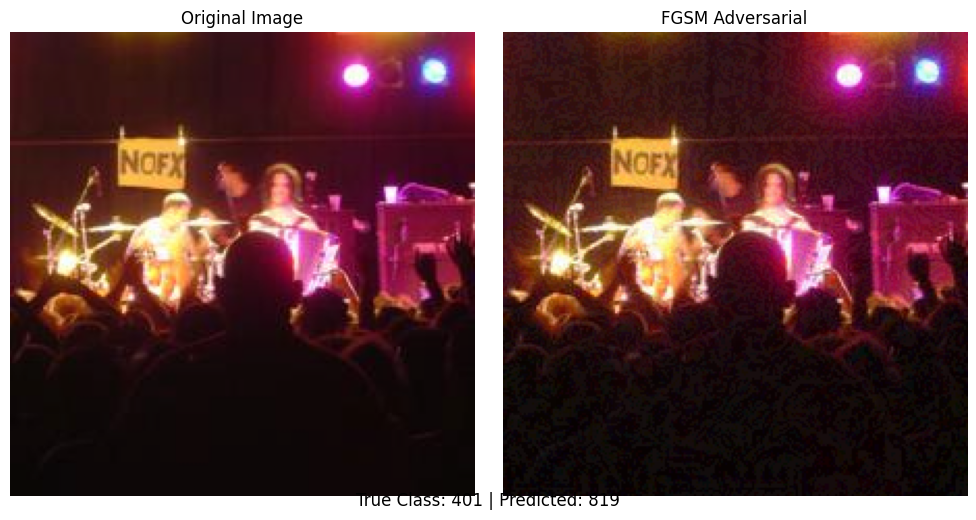

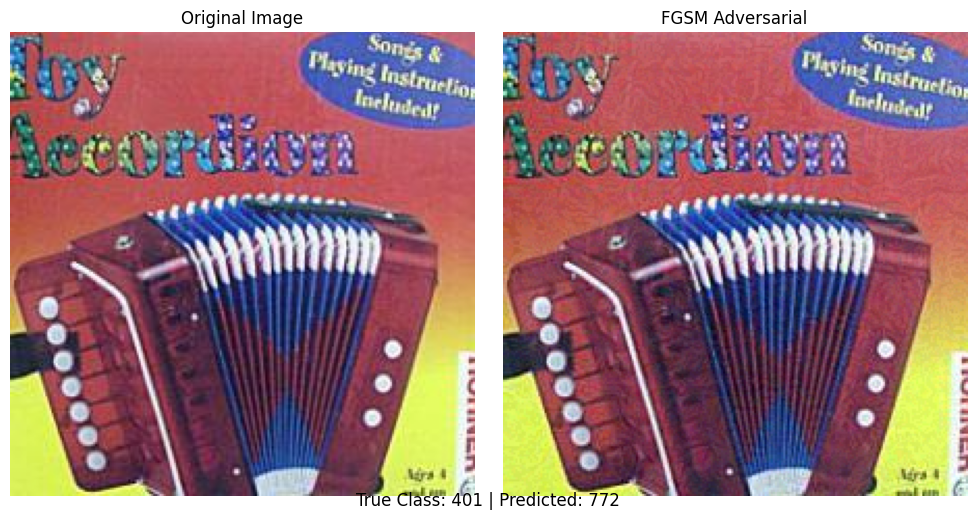

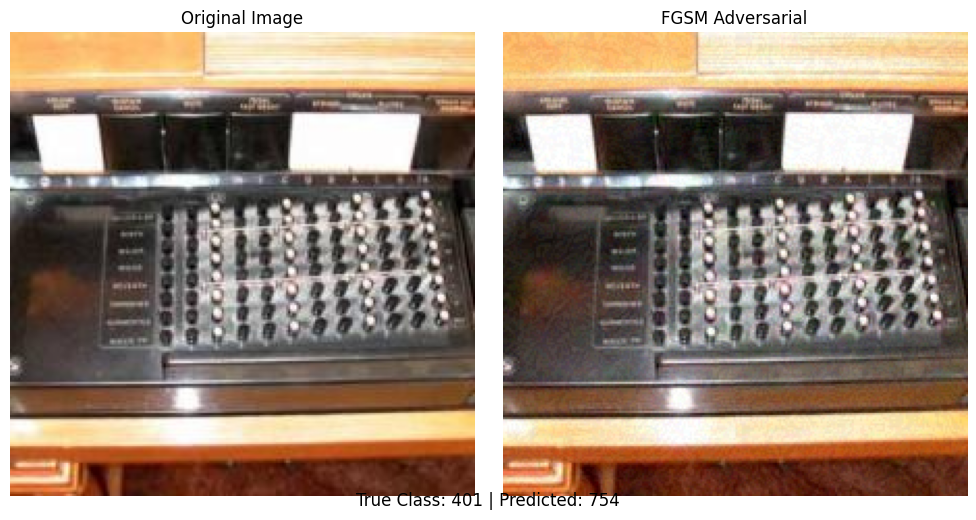

In [ ]:
# Cell 11
# Visualize misclassified examples
print("\nVisualizing misclassified examples:")
clean_batch = torch.cat(clean_tensors)
adv_batch = torch.cat(adversarial_tensors)
true_labels_tensor = torch.tensor(ground_truth_labels)
pred_labels_tensor = torch.tensor(predicted_labels)

# Find misclassified indices
misclassified = (pred_labels_tensor != true_labels_tensor).nonzero(as_tuple=True)[0]

# Visualize up to 5 misclassified examples
for i in misclassified[:5]:
    # Prepare images for display
    clean_img = reverse_normalization(clean_batch[i])
    clean_img = clean_img.permute(1, 2, 0).detach().numpy()
    clean_img = np.clip(clean_img, 0, 1)
    
    adv_img = reverse_normalization(adv_batch[i])
    adv_img = adv_img.permute(1, 2, 0).detach().numpy()
    adv_img = np.clip(adv_img, 0, 1)
    
    # Create comparison plot
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(clean_img)
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    axes[1].imshow(adv_img)
    axes[1].set_title("FGSM Adversarial")
    axes[1].axis('off')
    
    plt.figtext(0.5, 0.01, 
                "True Class: {} | Predicted: {}".format(
                    true_labels_tensor[i].item()+401, 
                    pred_labels_tensor[i].item()
                ), 
                ha="center", fontsize=12)
    plt.tight_layout()
    plt.show()

## Evaluating Model Performance on FGSM Examples

We quantitatively evaluate how the FGSM attack affects model performance:
1. Calculate top-1 and top-5 accuracy on the adversarial examples
2. Compare with the baseline performance from earlier
3. Output the effectiveness of the attack

This measures how successfully the FGSM attack degrades model performance.

In [ ]:
# Cell 12
# Evaluate accuracy on adversarial examples
print("\nEvaluating model on FGSM adversarial examples...")
correct_top1 = 0
correct_top5 = 0
total_samples = 0

model.eval()
with torch.no_grad():
    for start_idx in range(0, len(adv_batch), 32):
        end_idx = min(start_idx + 32, len(adv_batch))
        batch = adv_batch[start_idx:end_idx].to(device)
        labels = true_labels_tensor[start_idx:end_idx].to(device) + 401
        
        # Forward pass
        outputs = model(batch)
        
        # Calculate accuracy
        _, top5 = outputs.topk(5, dim=1)
        top1 = top5[:, 0]
        
        # Update counters
        correct_top1 += (top1 == labels).sum().item()
        for i in range(len(labels)):
            if labels[i].item() in top5[i]:
                correct_top5 += 1
        total_samples += len(labels)

fgsm_accuracy_top1 = (correct_top1 / total_samples) * 100
fgsm_accuracy_top5 = (correct_top5 / total_samples) * 100

print("\nFGSM Attack Results (ε={})".format(PERTURBATION_SIZE))
print("Top-1 Accuracy: {:.2f}%".format(fgsm_accuracy_top1))
print("Top-5 Accuracy: {:.2f}%".format(fgsm_accuracy_top5))


Evaluating model on FGSM adversarial examples...

FGSM Attack Results (ε=0.02)
Top-1 Accuracy: 6.00%
Top-5 Accuracy: 16.60%


# Task 3: PGD

## PGD Attack Implementation

The Projected Gradient Descent (PGD) attack is more powerful than FGSM:
1. It performs multiple iteration steps, gradually refining the adversarial example
2. Each step takes a gradient step and then projects back onto the epsilon-ball
3. This ensures the perturbation stays within bounds while maximizing the attack strength

PGD often achieves better attack success rates than single-step methods like FGSM.

In [ ]:
# Cell 13
def pgd_attack(model, original_image, target_class, epsilon, step_size, num_steps, 
               class_ids, device):
    """
    Run Projected Gradient Descent attack
    
    Args:
        model: The target neural network
        original_image: Clean input image tensor
        target_class: Ground truth label
        epsilon: Maximum perturbation size (L-infinity norm)
        step_size: Step size for each iteration
        num_steps: Number of attack iterations
        class_ids: List of target class indices
        device: Computation device (CPU/GPU)
        
    Returns:
        Adversarial example tensor
    """
    # Save original for projection step
    original_copy = original_image.clone().detach()
    
    # Initialize with the original image
    perturbed = original_copy.clone().detach()
    
    # PGD iteration loop
    for _ in range(num_steps):
        # Enable gradients
        perturbed.requires_grad_(True)
        
        # Forward pass with normalized input
        normalized_input = apply_normalization(perturbed)
        output = model(normalized_input)
        
        # Calculate loss
        target_tensor = torch.tensor([target_class], device=device)
        loss_fn = torch.nn.CrossEntropyLoss()
        loss = loss_fn(output[:, class_ids], target_tensor)
        
        # Compute gradient
        model.zero_grad()
        loss.backward()
        
        # Update with gradient step
        with torch.no_grad():
            # Take step in gradient direction
            gradient_step = step_size * perturbed.grad.sign()
            perturbed = perturbed + gradient_step
            
            # Project back into epsilon ball
            perturbation = perturbed - original_copy
            perturbation = torch.clamp(perturbation, -epsilon, epsilon)
            perturbed = torch.clamp(original_copy + perturbation, 0, 1)
    
    return perturbed

## Generating PGD Adversarial Examples

We implement the PGD attack with:
1. Maximum perturbation size (epsilon) of 0.02
2. Step size (alpha) of 0.001
3. 20 total iterations

For each image:
1. Generate the adversarial example using PGD
2. Save it to disk
3. Evaluate the model prediction
4. Track perturbation statistics

We expect PGD to create more effective adversarial examples than FGSM.

In [ ]:
# Cell 14
# Attack parameters
MAX_PERTURBATION = 0.02    # Epsilon value (maximum perturbation)
ITERATION_STEP = 0.001     # Alpha value (step size)
TOTAL_ITERATIONS = 20      # Number of iterations

# Lists for storing results
clean_image_tensors = []
adversarial_image_tensors = []
original_labels = []
adversarial_predictions = []
perturbation_sizes = []

print("Generating PGD adversarial examples...")

# Main attack loop
for idx, (image, label) in enumerate(tqdm(raw_dataset, desc="PGD Attack")):
    # Prepare image tensor
    img_tensor = convert_to_tensor(image).unsqueeze(0).to(device)
    
    # Generate adversarial example
    adv_tensor = pgd_attack(
        model, img_tensor, label, 
        MAX_PERTURBATION, ITERATION_STEP, TOTAL_ITERATIONS,
        target_class_ids, device
    )
    
    # Save adversarial image
    output_path = os.path.join("PGD_Adversarial_Examples", "pgd_adv_{0:04d}.png".format(idx))
    save_image(adv_tensor.squeeze().cpu(), output_path)
    
    # Get prediction on adversarial example
    with torch.no_grad():
        normalized_adv = apply_normalization(adv_tensor)
        predictions = model(normalized_adv)
        predicted_class = predictions.argmax(dim=1).item()
    
    # Store for evaluation
    clean_image_tensors.append(apply_normalization(img_tensor).cpu())
    adversarial_image_tensors.append(normalized_adv.cpu())
    original_labels.append(label)
    adversarial_predictions.append(predicted_class)
    
    # Calculate perturbation magnitude
    l_inf_distance = torch.max(torch.abs(adv_tensor - img_tensor)).item()
    perturbation_sizes.append(l_inf_distance)

print("✓ PGD attack completed successfully")
print("\nMaximum L∞ perturbation: {:.6f}".format(max(perturbation_sizes)))

Generating PGD adversarial examples...


PGD Attack:   0%|          | 0/500 [00:00<?, ?it/s]

✓ PGD attack completed successfully

Maximum L∞ perturbation: 0.020000


## Visualizing PGD Attack Results

We visualize successful PGD attacks:
1. Find images where the model was fooled by the attack
2. Display side-by-side comparisons of original and adversarial images
3. Show the true class and incorrect prediction

These visualizations demonstrate that even though the perturbations are imperceptible to humans, they can completely change the model's prediction.


Visualizing examples of successful attacks:


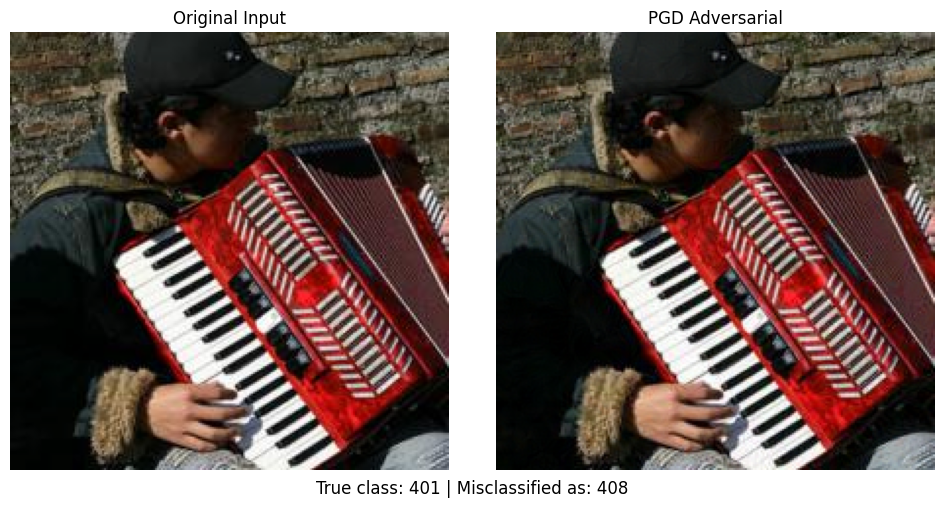

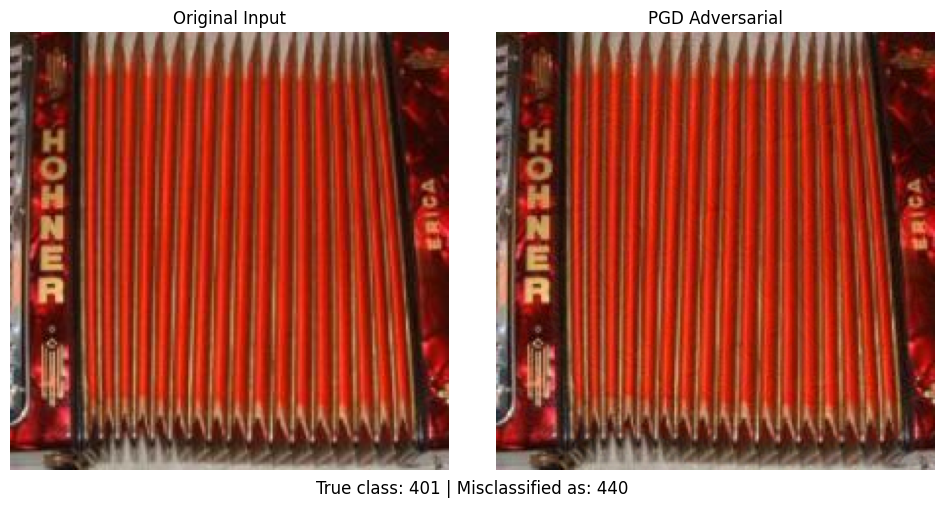

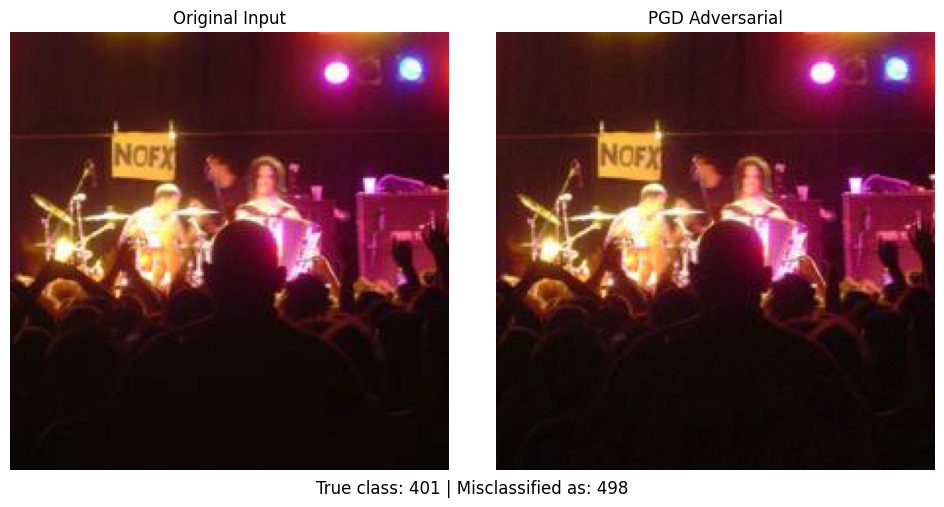

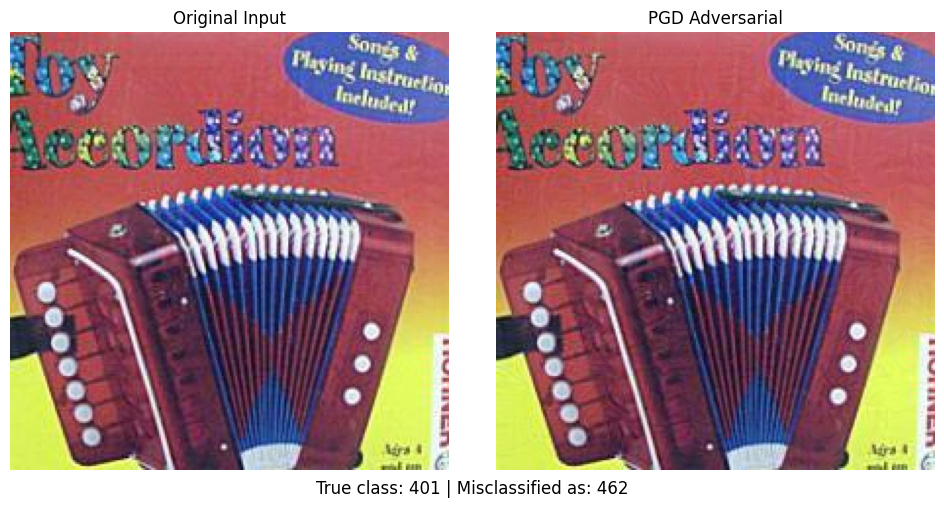

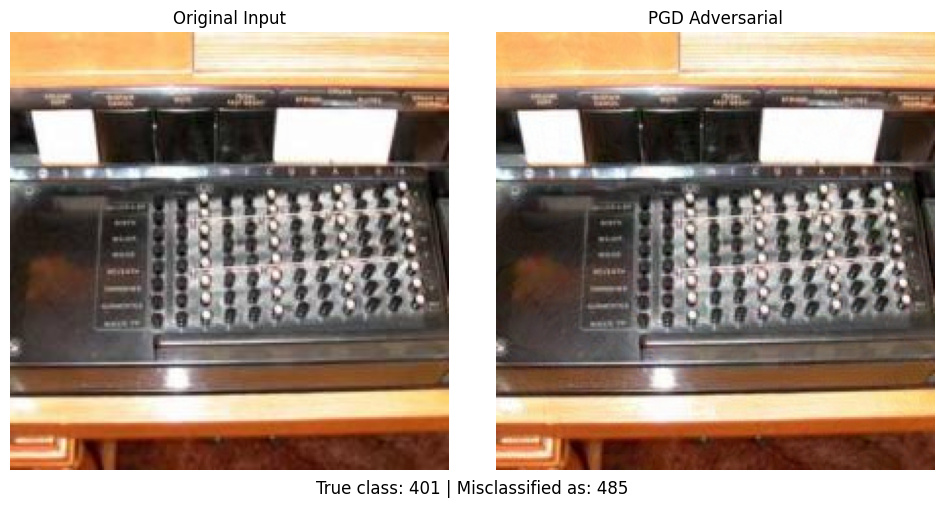

In [ ]:
# Cell 15
# Visualize misclassifications
print("\nVisualizing examples of successful attacks:")
clean_batch = torch.cat(clean_image_tensors)
adversarial_batch = torch.cat(adversarial_image_tensors)
true_labels_tensor = torch.tensor(original_labels)
predicted_labels_tensor = torch.tensor(adversarial_predictions)

# Find indices where attack succeeded
misclassified_indices = (predicted_labels_tensor != true_labels_tensor).nonzero(as_tuple=True)[0]

# Show up to 5 examples
for i in misclassified_indices[:5]:
    # Prepare images for display
    clean_display = reverse_normalization(clean_batch[i])
    clean_display = clean_display.permute(1, 2, 0).detach().numpy()
    clean_display = np.clip(clean_display, 0, 1)
    
    adv_display = reverse_normalization(adversarial_batch[i])
    adv_display = adv_display.permute(1, 2, 0).detach().numpy()
    adv_display = np.clip(adv_display, 0, 1)
    
    # Create comparison display
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    axes[0].imshow(clean_display)
    axes[0].set_title("Original Input")
    axes[0].axis('off')
    
    axes[1].imshow(adv_display)
    axes[1].set_title("PGD Adversarial")
    axes[1].axis('off')
    
    # Add caption with class information
    plt.figtext(
        0.5, 0.01,
        "True class: {} | Misclassified as: {}".format(
            true_labels_tensor[i].item()+401, 
            predicted_labels_tensor[i].item()
        ),
        ha="center", fontsize=12, backgroundcolor="white"
    )
    
    plt.tight_layout(pad=2)
    plt.show()

## Evaluating Model Performance on PGD Examples

We quantify the effectiveness of the PGD attack:
1. Calculate top-1 and top-5 accuracy on PGD adversarial examples
2. Compare with both baseline and FGSM results
3. Output the attack effectiveness statistics

This helps us assess whether the iterative nature of PGD provides a stronger attack than FGSM.

In [ ]:
# Cell 16
# Evaluate model on adversarial examples
print("\nEvaluating model robustness against PGD attack...")
correct_top1 = 0
correct_top5 = 0
sample_count = 0

model.eval()
with torch.no_grad():
    for start_idx in range(0, len(adversarial_batch), 32):
        end_idx = min(start_idx + 32, len(adversarial_batch))
        batch = adversarial_batch[start_idx:end_idx].to(device)
        labels = true_labels_tensor[start_idx:end_idx].to(device) + 401
        
        # Get predictions
        outputs = model(batch)
        
        # Calculate top predictions
        _, top5_preds = outputs.topk(5, dim=1)
        top1_preds = top5_preds[:, 0]
        
        # Update accuracy counters
        correct_top1 += (top1_preds == labels).sum().item()
        for j in range(len(labels)):
            if labels[j].item() in top5_preds[j]:
                correct_top5 += 1
        sample_count += len(labels)

# Calculate final accuracy
pgd_accuracy_top1 = (correct_top1 / sample_count) * 100
pgd_accuracy_top5 = (correct_top5 / sample_count) * 100

print("\nPGD Attack Results (ε={}, α={}, steps={})".format(
    MAX_PERTURBATION, ITERATION_STEP, TOTAL_ITERATIONS))
print("Top-1 Accuracy: {:.2f}%".format(pgd_accuracy_top1))
print("Top-5 Accuracy: {:.2f}%".format(pgd_accuracy_top5))


Evaluating model robustness against PGD attack...

PGD Attack Results (ε=0.02, α=0.001, steps=20)
Top-1 Accuracy: 0.20%
Top-5 Accuracy: 1.40%


## Analyzing PGD Iteration Count Effect

We study how the number of iterations affects PGD attack strength:
1. Test different iteration counts (1 to 20)
2. Measure top-1 and top-5 accuracy for each
3. Plot the relationship between iteration count and model accuracy

This analysis helps us understand the trade-off between computational cost (more iterations) and attack effectiveness.


Studying effect of iteration count on attack strength...


Iterations: 1:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 2:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 3:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 4:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 5:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 6:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 7:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 8:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 9:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 10:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 11:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 12:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 13:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 14:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 15:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 16:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 17:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 18:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 19:   0%|          | 0/500 [00:00<?, ?it/s]

Iterations: 20:   0%|          | 0/500 [00:00<?, ?it/s]

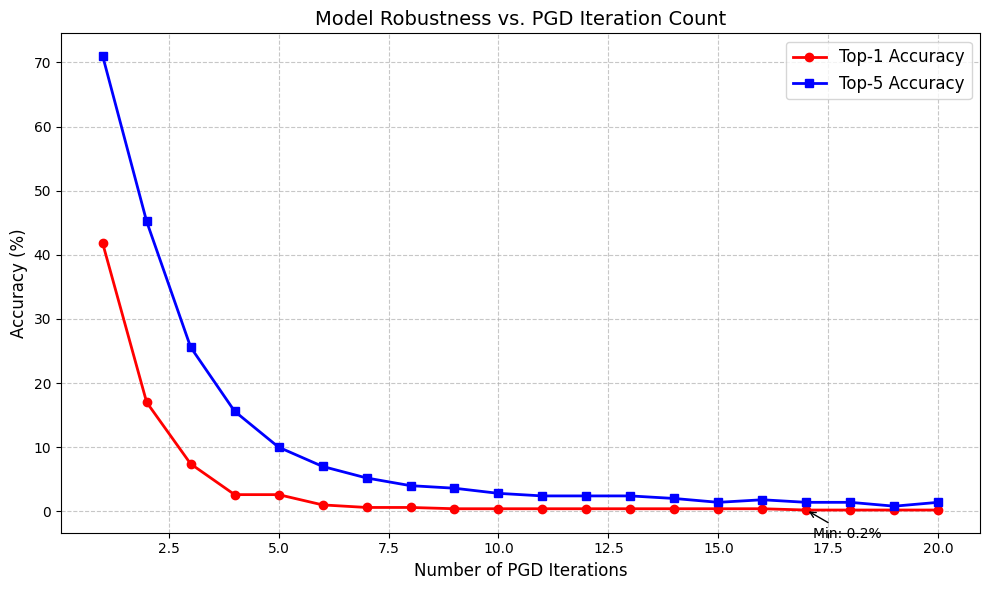

In [ ]:
# Cell 17
# Analyze effect of iteration count on attack strength
print("\nStudying effect of iteration count on attack strength...")
iteration_range = list(range(1, TOTAL_ITERATIONS+1))
top1_accuracies = []
top5_accuracies = []

# Evaluate each iteration count
for iteration_count in iteration_range:
    correct_t1 = 0
    correct_t5 = 0
    total = len(raw_dataset)
    
    # Run PGD and evaluate each example
    for img, true_class in tqdm(raw_dataset, desc="Iterations: {}".format(iteration_count)):
        # Convert to tensor
        input_tensor = convert_to_tensor(img).unsqueeze(0).to(device)
        true_class = true_class + 401  # Apply offset
        
        # Run attack with specific iteration count
        adv_example = pgd_attack(
            model, input_tensor, true_class-401,  # Removing offset for attack function 
            MAX_PERTURBATION, ITERATION_STEP, iteration_count,
            target_class_ids, device
        )
        
        # Evaluate model on this example
        with torch.no_grad():
            normalized_adv = apply_normalization(adv_example)
            preds = model(normalized_adv)
            _, top5 = preds.topk(5, dim=1)
            top1 = top5[0, 0].item()
            
            # Check accuracy
            if top1 == true_class:
                correct_t1 += 1
            if true_class in top5[0].tolist():
                correct_t5 += 1
    
    # Calculate and store accuracy
    top1_accuracies.append(100 * correct_t1 / total)
    top5_accuracies.append(100 * correct_t5 / total)

# Visualize results
plt.figure(figsize=(10, 6))
plt.plot(iteration_range, top1_accuracies, 'r-o', linewidth=2, label="Top-1 Accuracy")
plt.plot(iteration_range, top5_accuracies, 'b-s', linewidth=2, label="Top-5 Accuracy")

plt.grid(True, linestyle='--', alpha=0.7)
plt.xlabel("Number of PGD Iterations", fontsize=12)
plt.ylabel("Accuracy (%)", fontsize=12)
plt.title("Model Robustness vs. PGD Iteration Count", fontsize=14)
plt.legend(fontsize=12)

# Add highlights for min/max points
plt.annotate(f"Min: {min(top1_accuracies):.1f}%", 
             xy=(iteration_range[top1_accuracies.index(min(top1_accuracies))], min(top1_accuracies)),
             xytext=(5, -20), textcoords="offset points",
             arrowprops=dict(arrowstyle="->"))

plt.tight_layout()
plt.show()

## ImageProcessor Class Implementation

We create a dedicated class to handle image transformations:
1. Initialization with ImageNet normalization constants
2. Methods for converting images to tensors
3. Methods for normalizing and denormalizing tensors
4. Utility function to prepare tensors for visualization

This class organizes image processing functions and will be used in the patch attack implementation.

In [ ]:
# Cell 18
# Helper class for image processing
class ImageProcessor:
    """Handles image transformations and normalizations"""
    
    def __init__(self):
        self.imagenet_means = np.array([0.485, 0.456, 0.406])
        self.imagenet_stds = np.array([0.229, 0.224, 0.225])
        
    def to_tensor(self, pil_image):
        """Convert PIL image to tensor"""
        return T.ToTensor()(pil_image)
        
    def normalize(self, tensor):
        """Apply ImageNet normalization"""
        return T.Normalize(
            mean=self.imagenet_means,
            std=self.imagenet_stds
        )(tensor)
        
    def denormalize(self, tensor):
        """Reverse normalization for visualization"""
        return T.Normalize(
            mean=[-m/s for m, s in zip(self.imagenet_means, self.imagenet_stds)],
            std=[1/s for s in self.imagenet_stds]
        )(tensor)
        
    def prepare_for_display(self, tensor):
        """Convert tensor to numpy array for matplotlib"""
        img = self.denormalize(tensor)
        img = img.permute(1, 2, 0).detach().numpy()
        return np.clip(img, 0, 1)

# Task 4: Patch

## Localized Patch Attack Implementation

The patch attack applies perturbations to only a small region of the image:
1. Randomly position a square patch on the image
2. Calculate gradient only within the patch area
3. Update only the patch region while keeping the rest of the image unchanged
4. Project perturbations to stay within epsilon bounds
5. Iterate to refine the attack

This approach simulates real-world scenarios where attackers might only be able to modify a small part of an image.

In [ ]:
# Cell 19
def create_localized_patch_attack(model, image, true_class, epsilon, step_size, 
                                  iterations, patch_dim, processor, device):
    """
    Generate adversarial patch attack
    
    Args:
        model: Target neural network
        image: Original image tensor
        true_class: Ground truth label
        epsilon: Maximum perturbation magnitude
        step_size: Step size for gradient updates
        iterations: Number of optimization steps
        patch_dim: Size of the square patch
        processor: ImageProcessor instance
        device: Computation device
        
    Returns:
        Adversarial example with localized patch
    """
    # Make a copy of the original
    original = image.clone().detach()
    
    # Initialize adversarial example
    adversarial = original.clone().detach()
    
    # Get image dimensions
    _, _, height, width = image.shape
    
    # Randomly position patch
    patch_y = np.random.randint(0, height - patch_dim + 1)
    patch_x = np.random.randint(0, width - patch_dim + 1)
    
    # Optimization loop
    for _ in range(iterations):
        # Enable gradients
        adversarial.requires_grad_(True)
        
        # Forward pass
        output = model(processor.normalize(adversarial))
        
        # Compute loss
        criterion = torch.nn.CrossEntropyLoss()
        loss = criterion(output, torch.tensor([true_class], device=device))
        
        # Backward pass
        model.zero_grad()
        loss.backward()
        
        # Extract gradient
        full_gradient = adversarial.grad.clone()
        
        # Zero out gradient outside patch area
        mask = torch.zeros_like(full_gradient)
        mask[:, :, patch_y:patch_y+patch_dim, patch_x:patch_x+patch_dim] = 1
        localized_gradient = full_gradient * mask
        
        # Update only the patch
        with torch.no_grad():
            update = step_size * localized_gradient.sign()
            adversarial = adversarial + update
            
            # Project perturbation
            delta = torch.clamp(adversarial - original, -epsilon, epsilon)
            adversarial = torch.clamp(original + delta, 0, 1).detach()
    
    return adversarial

## Generating Patch Attack Examples

We implement the patch attack with:
1. Larger epsilon (0.48) since perturbations are localized
2. Step size of 0.05
3. 100 iterations for convergence
4. Patch size of 32×32 pixels

For each image:
1. Generate the adversarial patch
2. Save the resulting image
3. Evaluate model prediction
4. Track statistics

The localized nature allows for stronger perturbations while remaining less conspicuous overall.

In [ ]:
# Cell 20
# Initialize image processor
img_processor = ImageProcessor()

# Attack parameters
PATCH_EPSILON = 0.48     # Larger epsilon for patch since it's localized
PATCH_ALPHA = 0.05       # Step size
PATCH_ITERATIONS = 100   # More iterations for better convergence
PATCH_SIZE = 32          # Patch dimensions (32×32 pixels)

# Storage for evaluation
original_tensors = []
adversarial_tensors = []
true_class_labels = []
predicted_labels = []
perturbation_magnitudes = []

print("Executing localized patch attack...")

# Generate adversarial examples
for idx, (img, label) in enumerate(tqdm(raw_dataset, desc="Patch Attack")):
    # Convert to tensor and move to device
    input_tensor = img_processor.to_tensor(img).unsqueeze(0).to(device)
    adjusted_label = label + 401  # Add offset for ImageNet classes
    
    # Generate adversarial example
    adv_example = create_localized_patch_attack(
        model, input_tensor, adjusted_label, 
        PATCH_EPSILON, PATCH_ALPHA, PATCH_ITERATIONS,
        PATCH_SIZE, img_processor, device
    )
    
    # Save to disk
    save_path = os.path.join("Patch_Attack_Examples", "patch_adv_{0:04d}.png".format(idx))
    save_image(adv_example.squeeze().cpu(), save_path)
    
    # Get model prediction
    with torch.no_grad():
        normalized_adv = img_processor.normalize(adv_example)
        output = model(normalized_adv)
        prediction = output.argmax(dim=1).item()
    
    # Store for evaluation
    original_tensors.append(img_processor.normalize(input_tensor).cpu())
    adversarial_tensors.append(normalized_adv.cpu())
    true_class_labels.append(adjusted_label)
    predicted_labels.append(prediction)
    
    # Calculate perturbation size
    l_inf_norm = torch.max(torch.abs(adv_example - input_tensor)).item()
    perturbation_magnitudes.append(l_inf_norm)

print("✓ Patch attack completed")
print("\nMaximum L∞ perturbation: {:.6f}".format(max(perturbation_magnitudes)))

Executing localized patch attack...


Patch Attack:   0%|          | 0/500 [00:00<?, ?it/s]

✓ Patch attack completed

Maximum L∞ perturbation: 0.480000


## Visualizing Patch Attack Results

We visualize successful patch attacks:
1. Find images where the model was fooled
2. Display side-by-side comparisons
3. Show classification details

These visualizations reveal how a small localized perturbation can dramatically affect model predictions, even though the majority of the image remains unchanged.


Visualizing successful attacks:


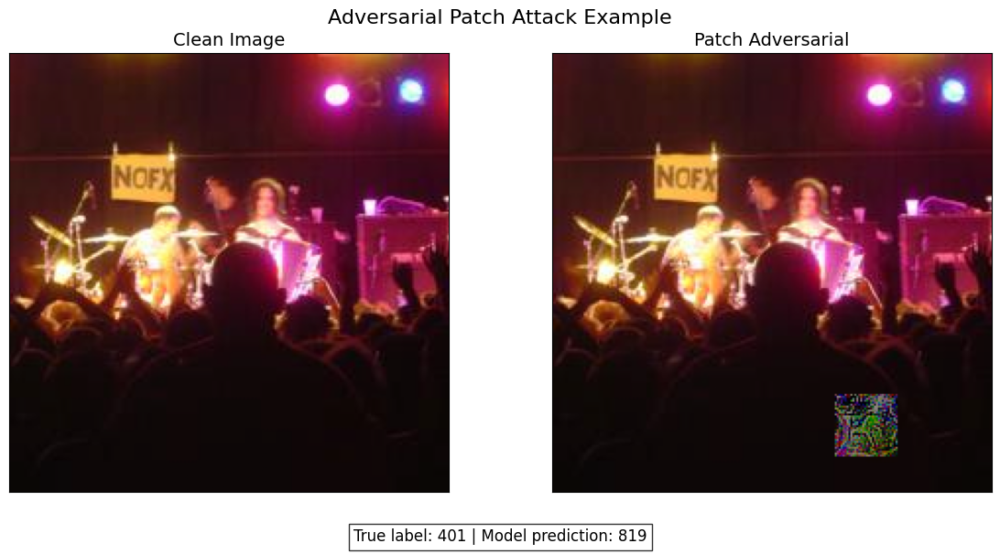

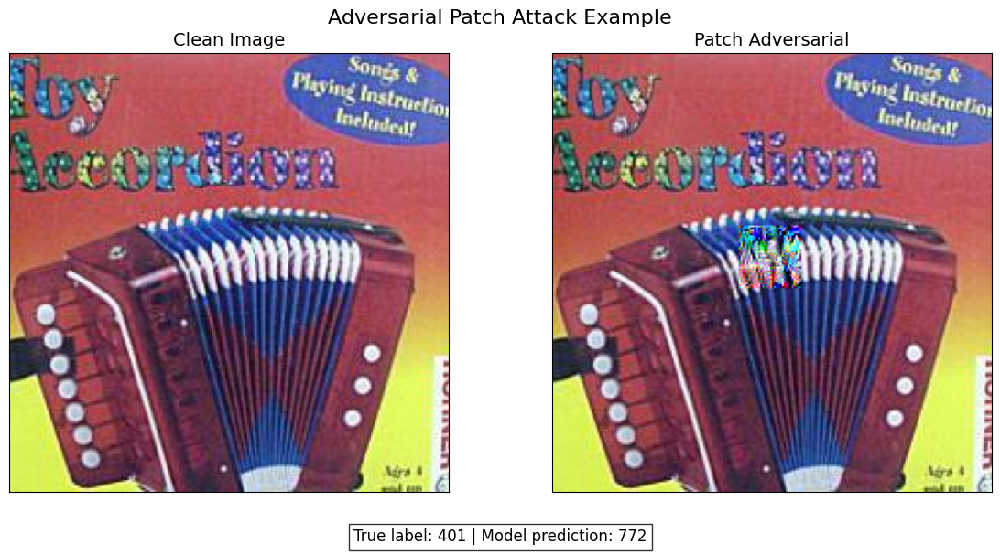

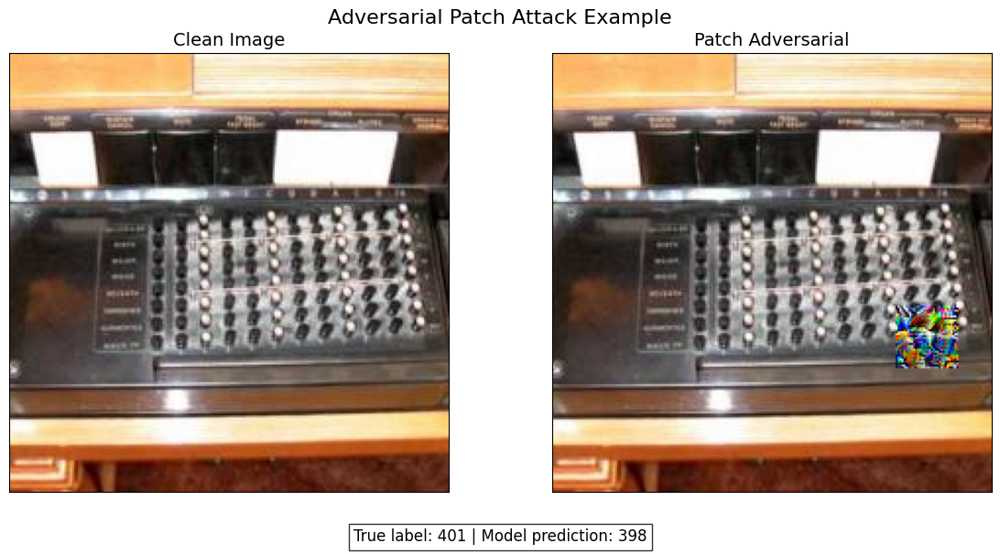

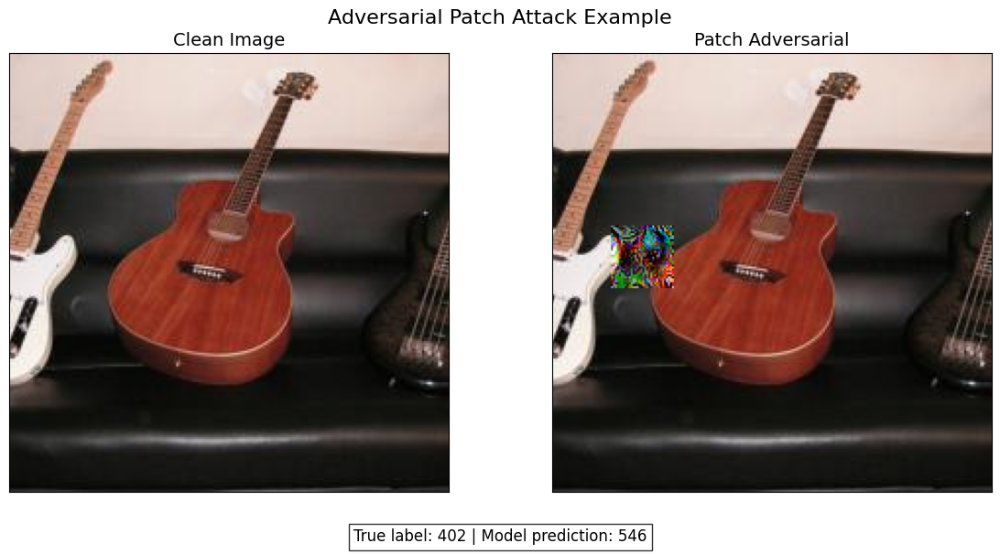

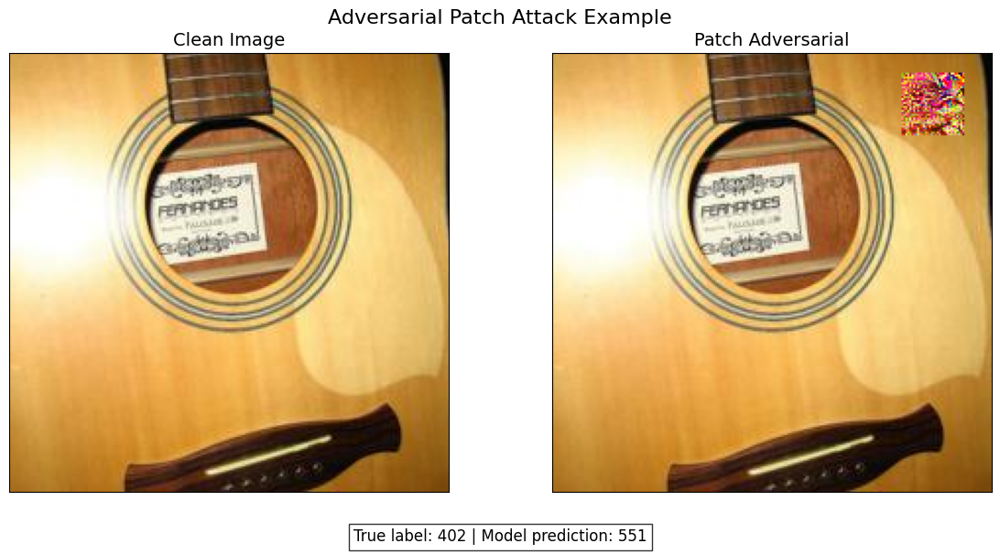

In [ ]:
# Cell 21
# Visualize examples
print("\nVisualizing successful attacks:")
original_batch = torch.cat(original_tensors)
adversarial_batch = torch.cat(adversarial_tensors)
ground_truth = torch.tensor(true_class_labels)
predictions = torch.tensor(predicted_labels)

# Find successful attacks
successful_indices = (predictions != ground_truth).nonzero(as_tuple=True)[0]

# Display up to 5 examples
for i in successful_indices[:5]:
    # Prepare for display
    orig_display = img_processor.prepare_for_display(original_batch[i])
    adv_display = img_processor.prepare_for_display(adversarial_batch[i])
    
    # Create custom visualization
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(orig_display)
    axes[0].set_title("Clean Image", fontsize=14)
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    axes[1].imshow(adv_display)
    axes[1].set_title("Patch Adversarial", fontsize=14)
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    
    # Add more detailed caption
    plt.suptitle("Adversarial Patch Attack Example", fontsize=16)
    plt.figtext(
        0.5, 0.01,
        "True label: {} | Model prediction: {}".format(
            ground_truth[i].item(), predictions[i].item()
        ),
        ha="center", fontsize=12, bbox=dict(facecolor='white', alpha=0.8)
    )
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9, bottom=0.1)
    plt.show()

## Evaluating Model Performance on Patch Attacks

We quantify the effectiveness of the patch attack:
1. Calculate top-1 and top-5 accuracy on patched adversarial examples
2. Compare with results from FGSM and PGD attacks
3. Output the attack effectiveness statistics

This comparison helps us understand how localized attacks compare to global perturbation methods.

In [ ]:
# Cell 22
# Evaluate model performance on patch adversarial examples
print("\nEvaluating model robustness against patch attacks...")
correct_top1 = 0
correct_top5 = 0
total = 0

model.eval()
with torch.no_grad():
    for start_idx in range(0, len(adversarial_batch), 32):
        end_idx = min(start_idx + 32, len(adversarial_batch))
        batch = adversarial_batch[start_idx:end_idx].to(device)
        labels = ground_truth[start_idx:end_idx].to(device)
        
        # Get model predictions
        outputs = model(batch)
        
        # Calculate accuracy metrics
        _, top5 = outputs.topk(5, dim=1)
        top1 = top5[:, 0]
        
        # Update counters
        correct_top1 += (top1 == labels).sum().item()
        for j in range(len(labels)):
            if labels[j].item() in top5[j]:
                correct_top5 += 1
        total += len(labels)

# Final results
patch_accuracy_top1 = (correct_top1 / total) * 100
patch_accuracy_top5 = (correct_top5 / total) * 100

print("\nPatch Attack Results (ε={}, patch size={}×{})".format(
    PATCH_EPSILON, PATCH_SIZE, PATCH_SIZE))
print("Top-1 Accuracy: {:.2f}%".format(patch_accuracy_top1))
print("Top-5 Accuracy: {:.2f}%".format(patch_accuracy_top5))


Evaluating model robustness against patch attacks...

Patch Attack Results (ε=0.48, patch size=32×32)
Top-1 Accuracy: 4.60%
Top-5 Accuracy: 41.60%


In [ ]:
# Create comprehensive visualization comparing all attack methods
plt.figure(figsize=(14, 7))

# Setup data using variables from your existing code
categories = ['Original', 'FGSM Attack', 'PGD Attack', 'Patch Attack']

# Assuming we have these variables from previous cells
# For original model accuracy on clean images
original_top1 = accuracy_top1
original_top5 = accuracy_top5

# Compile accuracy metrics for ResNet34 (target model)
resnet_top1 = [original_top1, fgsm_accuracy_top1, pgd_accuracy_top1, patch_accuracy_top1]
resnet_top5 = [original_top5, fgsm_accuracy_top5, pgd_accuracy_top5, patch_accuracy_top5]

# Bar positions
x = np.arange(len(categories))
width = 0.2

# Create enhanced subplot
fig, ax = plt.subplots(figsize=(14, 7))

# Create bars with improved styling
ax.bar(x - width/2, resnet_top1, width, label='Top-1 Accuracy', 
      color='#1e88e5', alpha=0.85, edgecolor='black', linewidth=1)
ax.bar(x + width/2, resnet_top5, width, label='Top-5 Accuracy', 
      color='#43a047', alpha=0.85, edgecolor='black', linewidth=1)

# Add styling elements
ax.set_ylabel('Accuracy (%)', fontsize=13, fontweight='bold')
ax.set_title('Attack Performance Comparison on ResNet34', 
           fontsize=16, fontweight='bold', color='darkblue', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(categories, fontsize=12, fontweight='bold', rotation=0)
ax.set_ylim(0, 100)
ax.grid(True, linestyle='--', alpha=0.4, axis='y')
ax.legend(fontsize=11, loc='upper right', framealpha=0.95)

# Add data labels to bars
for i, v in enumerate(resnet_top1):
    ax.text(i - width/2, v + 1, f"{v:.1f}%", ha='center', fontsize=9, fontweight='bold')
    
for i, v in enumerate(resnet_top5):
    ax.text(i + width/2, v + 1, f"{v:.1f}%", ha='center', fontsize=9, fontweight='bold')

# Add success rate annotations
for i, v in enumerate(resnet_top1):
    if i > 0:  # Skip original accuracy
        success_rate = 100 - v
        ax.text(i, 10, f"Attack Success: {success_rate:.1f}%", 
                ha='center', fontsize=9, fontweight='bold', 
                bbox=dict(facecolor='white', alpha=0.7, boxstyle='round,pad=0.3'))

# Add a subtle background color
ax.set_facecolor('#f8f9fa')

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nAttack Effectiveness Summary:")
print(f"{'Method':<15} {'Top-1 Acc':<12} {'Top-5 Acc':<12} {'Attack Success':<15}")
print("-" * 55)
for i, category in enumerate(categories):
    success = "N/A" if i == 0 else f"{100-resnet_top1[i]:.1f}%"
    print(f"{category:<15} {resnet_top1[i]:.1f}%{' ':<7} {resnet_top5[i]:.1f}%{' ':<7} {success:<15}")

# Task 5: Transferbility 

## Custom Dataset for Adversarial Examples

We create a custom dataset class to handle loading adversarial examples:
1. Initialize with a directory path and corresponding labels
2. Load images from disk
3. Apply any required transformations
4. Maintain correspondence between images and original labels

This class facilitates the evaluation of transferability in the next sections.

In [ ]:
# Cell 23
# Define custom dataset for adversarial examples
class AdversarialImageDataset(torch.utils.data.Dataset):
    """Dataset for loading adversarial examples from a directory"""
    
    def __init__(self, directory, original_labels, transform=None):
        """
        Args:
            directory: Path to directory with adversarial images
            original_labels: List of labels corresponding to the original images
            transform: Optional transform to apply to the images
        """
        self.image_dir = directory
        # Sort filenames to maintain correspondence with original labels
        self.image_files = sorted([
            f for f in os.listdir(directory) if f.endswith('.png')
        ])
        self.transform = transform
        self.original_labels = original_labels
        
    def __len__(self):
        return len(self.image_files)
        
    def __getitem__(self, idx):
        # Load image
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        image = Image.open(image_path).convert('RGB')
        label = self.original_labels[idx]
        
        # Apply transforms if specified
        if self.transform:
            image = self.transform(image)
            
        return image, label

## Model Evaluation Function

We define a generic evaluation function that:
1. Takes a model, dataloader, and device as input
2. Computes top-1 and top-5 accuracy on the provided dataset
3. Returns a dictionary with the results

This function will be used to evaluate transferability across different models and attack types.

In [ ]:
# Cell 24
def evaluate_model(model, dataloader, device, class_indices=None):
    """
    Evaluate model accuracy on a dataset
    
    Args:
        model: Neural network to evaluate
        dataloader: DataLoader with test samples
        device: Computation device
        class_indices: Optional list of target class indices
        
    Returns:
        Dictionary with top-1 and top-5 accuracy
    """
    model.eval()
    
    top1_correct = 0
    top5_correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels in tqdm(dataloader, desc="Evaluating"):
            # Move data to device
            inputs = inputs.to(device)
            labels = labels.to(device) + 401  # ImageNet class offset
            
            # Forward pass
            outputs = model(inputs)
            
            # Apply mask if class indices provided
            if class_indices:
                outputs = outputs[:, class_indices]
                
            # Get top predictions
            _, top5 = outputs.topk(5, dim=1)
            top1 = top5[:, 0]
            
            # Update counters
            top1_correct += (top1 == labels).sum().item()
            top5_correct += sum(labels[i].item() in top5[i] for i in range(len(labels)))
            total += labels.size(0)
    
    # Calculate accuracy
    top1_acc = 100 * top1_correct / total
    top5_acc = 100 * top5_correct / total
    
    return {
        "top1": round(top1_acc, 2),
        "top5": round(top5_acc, 2)
    }

## Transferability Test Setup

We prepare to evaluate adversarial transferability:
1. Retrieve original image labels
2. Set up the preprocessing pipeline
3. Load a different model architecture (DenseNet121) 
4. Define the datasets to evaluate (original and all three attack methods)

Transferability tests whether adversarial examples created for one model can fool a different model.

In [ ]:
# Cell 25
# Get original labels
original_labels = [label for _, label in raw_dataset.samples]

# Setup preprocessing
preprocess = T.Compose([
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Define model to test transferability (different architecture)
transfer_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
transfer_model.eval()
transfer_model.to(device)

# Define datasets to evaluate
dataset_configs = {
    "Original Images": {
        "path": "/kaggle/input/testdata/TestDataSet",
        "type": "folder"
    },
    "FGSM Attack": {
        "path": "FGSM_Adversarial_Examples",
        "type": "flat"
    },
    "PGD Attack": {
        "path": "PGD_Adversarial_Examples",
        "type": "flat"
    },
    "Patch Attack": {
        "path": "Patch_Attack_Examples",
        "type": "flat"
    }
}

# Store results
results_table = {}

## Evaluating Attack Transferability

We evaluate how well the adversarial examples transfer to DenseNet121:
1. For each dataset (original, FGSM, PGD, patch)
2. Create the appropriate dataset and dataloader
3. Measure DenseNet121's accuracy on these examples
4. Store results for comparison

This analysis reveals whether adversarial examples are model-specific or transfer across architectures.

In [ ]:
# Cell 26
# Evaluate each dataset
for name, config in dataset_configs.items():
    print(f"\nAnalyzing transferability for: {name}")
    
    # Choose appropriate dataset type
    if config["type"] == "folder":
        # Standard dataset with folders
        dataset = torchvision.datasets.ImageFolder(
            root=config["path"],
            transform=preprocess
        )
    else:
        # Flat directory of adversarial examples
        dataset = AdversarialImageDataset(
            directory=config["path"],
            original_labels=original_labels,
            transform=preprocess
        )
    
    # Create dataloader
    loader = DataLoader(
        dataset,
        batch_size=32,
        shuffle=False,
        num_workers=4
    )
    
    # Evaluate model
    accuracy = evaluate_model(transfer_model, loader, device)
    results_table[name] = accuracy

# Print results
print("\n📊 Transferability Analysis (DenseNet-121):")
for dataset_name, metrics in results_table.items():
    print(f"  {dataset_name}: Top-1 = {metrics['top1']}%, Top-5 = {metrics['top5']}%")


Analyzing transferability for: Original Images


Evaluating:   0%|          | 0/16 [00:00<?, ?it/s]


Analyzing transferability for: FGSM Attack


Evaluating:   0%|          | 0/16 [00:00<?, ?it/s]


Analyzing transferability for: PGD Attack


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x791cf89da980>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x791cf89da980>Traceback (most recent call last):

  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Traceback (most recent call last):
      File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()Exception ignored in: 
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
<function _MultiProcessingDataLoaderIter.__del__ at 0x791cf89da980>    self._shutdown_workers()

if w.is_alive():  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

Traceback (most recent call last):
        File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
if w.

Evaluating:   0%|          | 0/16 [00:01<?, ?it/s]

^^^ ^^ ^^^ ^ ^^ ^ ^^ ^^^ ^^^^^^^^^^^^^^^^^^^^^^^^^^
^AssertionError^^^^: ^^can only test a child process^^
^^^^^^^^^^^^^^^^^
^AssertionError^: can only test a child process^
^^^^^^^^
AssertionError: can only test a child process



Analyzing transferability for: Patch Attack


Evaluating:   0%|          | 0/16 [00:00<?, ?it/s]


📊 Transferability Analysis (DenseNet-121):
  Original Images: Top-1 = 74.8%, Top-5 = 93.6%
  FGSM Attack: Top-1 = 48.8%, Top-5 = 75.4%
  PGD Attack: Top-1 = 54.4%, Top-5 = 84.4%
  Patch Attack: Top-1 = 67.2%, Top-5 = 89.8%


## Visualizing Transferability with Bar Charts

We create bar charts to visualize the transferability results:
1. Compare top-1 and top-5 accuracy across all datasets
2. Use color-coding to distinguish between different attack types
3. Add value labels to each bar for clarity
4. Apply appropriate styling and titles

These charts help us quickly understand which attacks transfer best to different architectures.

/tmp/ipykernel_35/2584653185.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(datasets, rotation=45, ha='right')
/tmp/ipykernel_35/2584653185.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(datasets, rotation=45, ha='right')


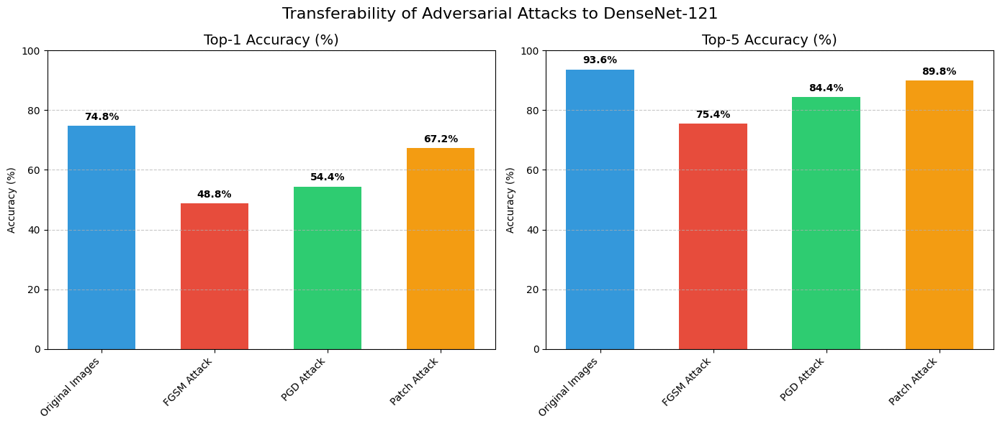

In [ ]:
# Cell 27
# Prepare data for plotting
datasets = list(results_table.keys())
top1_values = [results_table[d]["top1"] for d in datasets]
top5_values = [results_table[d]["top5"] for d in datasets]

# Bar colors
colors = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12']

# Create bar charts
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

ax[0].bar(datasets, top1_values, color=colors, width=0.6)
ax[0].set_title('Top-1 Accuracy (%)', fontsize=14)
ax[0].set_ylim(0, 100)
ax[0].set_ylabel('Accuracy (%)')
ax[0].set_xticklabels(datasets, rotation=45, ha='right')
ax[0].grid(axis='y', linestyle='--', alpha=0.7)

ax[1].bar(datasets, top5_values, color=colors, width=0.6)
ax[1].set_title('Top-5 Accuracy (%)', fontsize=14)
ax[1].set_ylim(0, 100)
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_xticklabels(datasets, rotation=45, ha='right')
ax[1].grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels on bars
for i, v in enumerate(top1_values):
    ax[0].text(i, v + 2, f"{v}%", ha='center', fontweight='bold')
    
for i, v in enumerate(top5_values):
    ax[1].text(i, v + 2, f"{v}%", ha='center', fontweight='bold')

plt.suptitle('Transferability of Adversarial Attacks to DenseNet-121', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()

## Radar Chart Visualization for Transferability

We create a radar chart as an alternative visualization:
1. Plot both top-1 and top-5 accuracy on a radial axis
2. Each attack type occupies a different angular position
3. Higher values (further from center) indicate better model performance
4. Lower values indicate more successful/transferable attacks

This visualization offers a different perspective on how the attacks compare in their transferability.

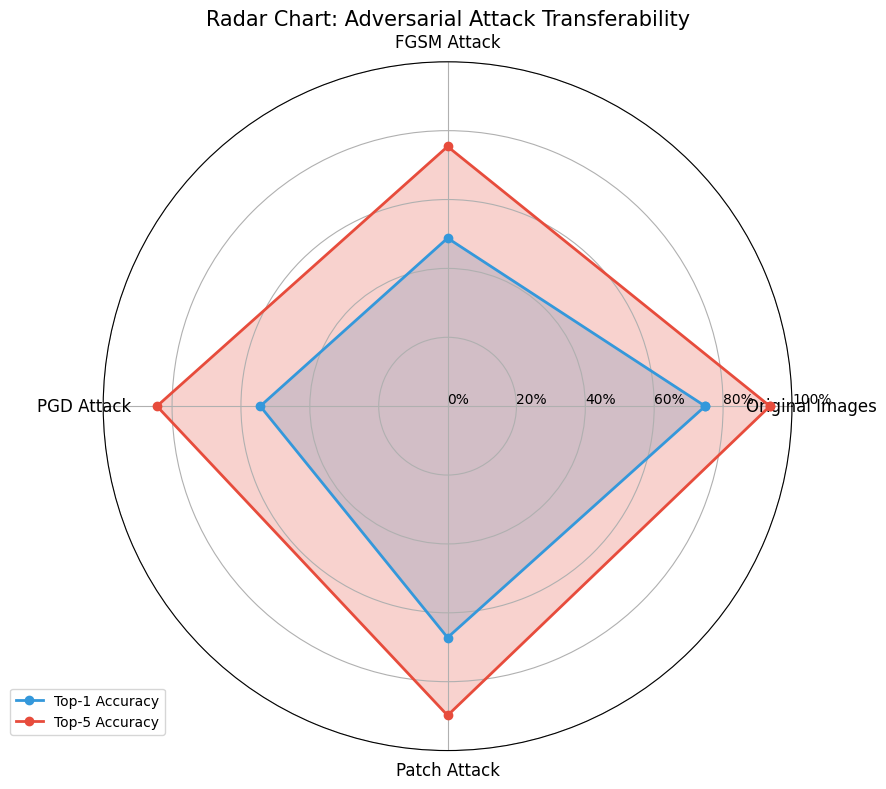

In [ ]:
# Cell 28
# Create radar chart for alternative visualization
plt.figure(figsize=(10, 8))
ax = plt.subplot(111, polar=True)

# Number of metrics
N = len(datasets)
angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
angles += angles[:1]  # Close the loop

# Add top-1 accuracy data
top1_values_radar = top1_values + [top1_values[0]]  # Close the loop
ax.plot(angles, top1_values_radar, 'o-', linewidth=2, label='Top-1 Accuracy', color='#3498db')
ax.fill(angles, top1_values_radar, alpha=0.25, color='#3498db')

# Add top-5 accuracy data
top5_values_radar = top5_values + [top5_values[0]]  # Close the loop
ax.plot(angles, top5_values_radar, 'o-', linewidth=2, label='Top-5 Accuracy', color='#e74c3c')
ax.fill(angles, top5_values_radar, alpha=0.25, color='#e74c3c')

# Set tick labels
plt.xticks(angles[:-1], datasets, size=12)

# Draw axis lines for each angle and label
ax.set_rlabel_position(0)
plt.yticks([0, 20, 40, 60, 80, 100], ['0%', '20%', '40%', '60%', '80%', '100%'], size=10)
plt.ylim(0, 100)

# Add legend and title
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
plt.title('Radar Chart: Adversarial Attack Transferability', size=15)

plt.tight_layout()
plt.show()